In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense,Input,Dropout, BatchNormalization
from tensorflow.keras.regularizers import l1
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_curve, roc_auc_score,accuracy_score,classification_report
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import euclidean
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import make_scorer,r2_score
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import LocalOutlierFactor
from tensorflow.keras.models import Model


In [2]:
df_normal = pd.read_csv('C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\SWaT_Dataset_Normal_v0.csv')
df_attack = pd.read_csv('C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\SWaT_Dataset_Attack_v0 - Copy.csv')

In [3]:
# Convert timestamps to datetime
df_normal['Timestamp'] = pd.to_datetime(df_normal['Timestamp'])


In [4]:
df_normal.head()

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,2015-12-22 16:00:00,2.470294,261.5804,2,2,1,244.3284,8.19008,306.101,2.471278,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
1,2015-12-22 16:00:01,2.457163,261.1879,2,2,1,244.3284,8.19008,306.101,2.468587,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
2,2015-12-22 16:00:02,2.439548,260.9131,2,2,1,244.3284,8.19008,306.101,2.467305,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
3,2015-12-22 16:00:03,2.428338,260.2850,2,2,1,244.3284,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
4,2015-12-22 16:00:04,2.424815,259.8925,2,2,1,244.4245,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal


In [5]:
df_attack.head()

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,28/12/2015 10:00:00 AM,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,...,2,1,250.8652,1.649953,189.5988,0.000128,1,1,1,Normal
1,28/12/2015 10:00:01 AM,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,...,2,1,250.8652,1.649953,189.6789,0.000128,1,1,1,Normal
2,28/12/2015 10:00:02 AM,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,...,2,1,250.8812,1.649953,189.6789,0.000128,1,1,1,Normal
3,28/12/2015 10:00:03 AM,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,...,2,1,250.8812,1.649953,189.6148,0.000128,1,1,1,Normal
4,28/12/2015 10:00:04 AM,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,...,2,1,250.8812,1.649953,189.5027,0.000128,1,1,1,Normal


In [6]:
df_normal.dtypes

Timestamp        datetime64[ns]
FIT101                  float64
LIT101                  float64
MV101                     int64
P101                      int64
P102                      int64
AIT201                  float64
AIT202                  float64
AIT203                  float64
FIT201                  float64
MV201                     int64
P201                      int64
P202                      int64
P203                      int64
P204                      int64
P205                      int64
P206                      int64
DPIT301                 float64
FIT301                  float64
LIT301                  float64
MV301                     int64
MV302                     int64
MV303                     int64
MV304                     int64
P301                      int64
P302                      int64
AIT401                  float64
AIT402                  float64
FIT401                  float64
LIT401                  float64
P401                      int64
P402    

In [7]:
df_attack['Timestamp'] = pd.to_datetime(df_attack['Timestamp'], format='mixed')
df_attack['Timestamp'] = df_attack['Timestamp'].dt.strftime('%Y-%m-%d %H:%M:%S')
df_attack.head()

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,...,2,1,250.8652,1.649953,189.5988,0.000128,1,1,1,Normal
1,2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,...,2,1,250.8652,1.649953,189.6789,0.000128,1,1,1,Normal
2,2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,...,2,1,250.8812,1.649953,189.6789,0.000128,1,1,1,Normal
3,2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,...,2,1,250.8812,1.649953,189.6148,0.000128,1,1,1,Normal
4,2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,...,2,1,250.8812,1.649953,189.5027,0.000128,1,1,1,Normal


In [8]:
df_attack['Timestamp'].min()

'2015-12-28 10:00:00'

In [9]:
df_normal['Timestamp'].max()

Timestamp('2015-12-28 09:59:59')

In [10]:
df_normal.shape

(496800, 53)

In [11]:
df_attack.shape

(449919, 53)

In [12]:
df_attack.dtypes

Timestamp         object
FIT101           float64
LIT101           float64
MV101              int64
P101               int64
P102               int64
AIT201           float64
AIT202           float64
AIT203           float64
FIT201           float64
MV201              int64
P201               int64
P202               int64
P203               int64
P204               int64
P205               int64
P206               int64
DPIT301          float64
FIT301           float64
LIT301           float64
MV301              int64
MV302              int64
MV303              int64
MV304              int64
P301               int64
P302               int64
AIT401           float64
AIT402           float64
FIT401           float64
LIT401           float64
P401               int64
P402               int64
P403               int64
P404               int64
UV401              int64
AIT501           float64
AIT502           float64
AIT503           float64
AIT504           float64
FIT501           float64


In [13]:
df = pd.concat([df_normal, df_attack])

In [14]:
df.shape

(946719, 53)

In [15]:
df.head()

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,2015-12-22 16:00:00,2.470294,261.5804,2,2,1,244.3284,8.19008,306.101,2.471278,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
1,2015-12-22 16:00:01,2.457163,261.1879,2,2,1,244.3284,8.19008,306.101,2.468587,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
2,2015-12-22 16:00:02,2.439548,260.9131,2,2,1,244.3284,8.19008,306.101,2.467305,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
3,2015-12-22 16:00:03,2.428338,260.2850,2,2,1,244.3284,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
4,2015-12-22 16:00:04,2.424815,259.8925,2,2,1,244.4245,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 946719 entries, 0 to 449918
Data columns (total 53 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      946719 non-null  object 
 1   FIT101         946719 non-null  float64
 2   LIT101         946719 non-null  float64
 3   MV101          946719 non-null  int64  
 4   P101           946719 non-null  int64  
 5   P102           946719 non-null  int64  
 6   AIT201         946719 non-null  float64
 7   AIT202         946719 non-null  float64
 8   AIT203         946719 non-null  float64
 9   FIT201         946719 non-null  float64
 10  MV201          946719 non-null  int64  
 11  P201           946719 non-null  int64  
 12  P202           946719 non-null  int64  
 13  P203           946719 non-null  int64  
 14  P204           946719 non-null  int64  
 15  P205           946719 non-null  int64  
 16  P206           946719 non-null  int64  
 17  DPIT301        946719 non-null  fl

# Visualization

In [17]:
df['Normal/Attack'].unique()

array(['Normal', 'Attack', 'A ttack'], dtype=object)

In [18]:
# Remove extra spaces
df['Normal/Attack'] = df['Normal/Attack'].str.replace(' ', '')

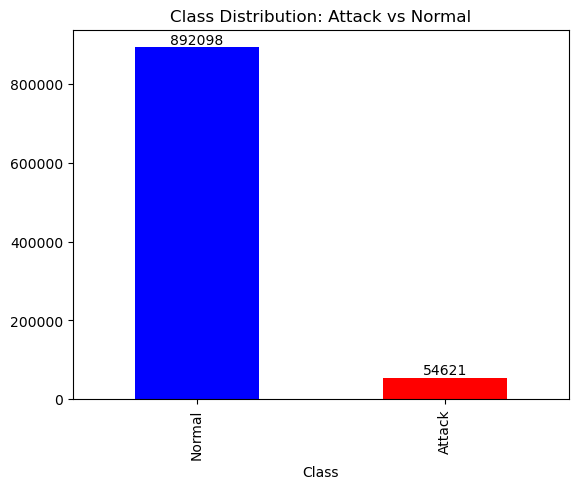

In [19]:
# Plotting class distribution (Normal vs. Attack) in SWaT
class_distribution = df['Normal/Attack'].value_counts()
fig, ax = plt.subplots()
bar_plot = class_distribution.plot(kind='bar', color=['blue', 'red'], ax=ax)

plt.title('Class Distribution: Attack vs Normal')
plt.xlabel('Class')
for i, count in enumerate(class_distribution):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.show()

In [20]:
# Converting the Timestamp to a datetime and set it as an index
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df= df.set_index('Timestamp')

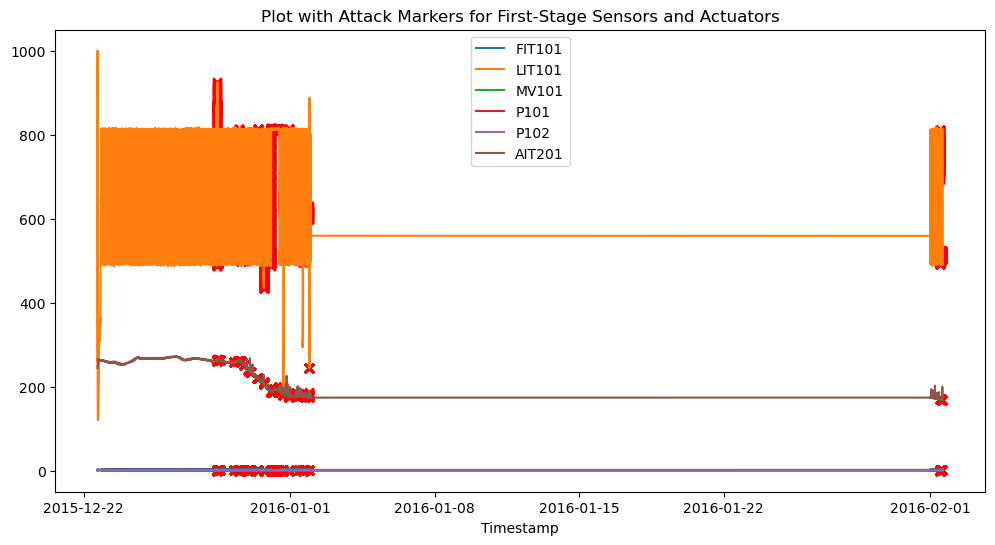

In [21]:
attack_data = df[df['Normal/Attack'] == 'Attack']

# List of all sensors and actuators in the first stage
first_stage_features = ['FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT201']

plt.figure(figsize=(12, 6))
for feature in first_stage_features:
    plt.plot(df.index, df[feature], label=feature)
    plt.scatter(attack_data.index, attack_data[feature], color='red', marker='x', label=None)
plt.legend()
plt.xlabel('Timestamp')
plt.title('Plot with Attack Markers for First-Stage Sensors and Actuators')
plt.show()

# Data Preprocessing

In [22]:
# Remove duplicate rows
df.drop_duplicates(inplace=True)

In [23]:
# Drop missing values
df.dropna(inplace=True)

df.shape

(928898, 52)

In [24]:
df.nunique()

FIT101            3953
LIT101           12162
MV101                3
P101                 2
P102                 2
AIT201            2338
AIT202            1763
AIT203            6868
FIT201            4989
MV201                3
P201                 2
P202                 1
P203                 2
P204                 2
P205                 2
P206                 2
DPIT301           5180
FIT301            8281
LIT301           11966
MV301                3
MV302                3
MV303                3
MV304                3
P301                 2
P302                 2
AIT401              37
AIT402            4127
FIT401             968
LIT401           15141
P401                 1
P402                 2
P403                 2
P404                 1
UV401                2
AIT501            1724
AIT502            3470
AIT503            1123
AIT504             565
FIT501            1027
FIT502            1560
FIT503             499
FIT504             289
P501                 2
P502       

In [25]:
df = df.loc[:, df.nunique() > 1]

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 928898 entries, 2015-12-22 16:00:00 to 2016-02-01 14:59:59
Data columns (total 46 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   FIT101         928898 non-null  float64
 1   LIT101         928898 non-null  float64
 2   MV101          928898 non-null  int64  
 3   P101           928898 non-null  int64  
 4   P102           928898 non-null  int64  
 5   AIT201         928898 non-null  float64
 6   AIT202         928898 non-null  float64
 7   AIT203         928898 non-null  float64
 8   FIT201         928898 non-null  float64
 9   MV201          928898 non-null  int64  
 10  P201           928898 non-null  int64  
 11  P203           928898 non-null  int64  
 12  P204           928898 non-null  int64  
 13  P205           928898 non-null  int64  
 14  P206           928898 non-null  int64  
 15  DPIT301        928898 non-null  float64
 16  FIT301         928898 non-null  float64


In [27]:
# Convert "Normal/Attack" column to binary
df['Normal/Attack'] = df['Normal/Attack'].apply(lambda x: 1 if x == 'Attack' else 0)


In [28]:
X = df.drop('Normal/Attack', axis=1)
y= df['Normal/Attack']
y = y.reset_index(drop=True)

In [29]:
# Numerical and categorical features
numerical_features = []
categorical_features = []

for column in X.columns:
    unique_values = X[column].nunique()
    if unique_values > 10:
        numerical_features.append(column)
    else:
        categorical_features.append(column)

In [30]:
numerical_features

['FIT101',
 'LIT101',
 'AIT201',
 'AIT202',
 'AIT203',
 'FIT201',
 'DPIT301',
 'FIT301',
 'LIT301',
 'AIT401',
 'AIT402',
 'FIT401',
 'LIT401',
 'AIT501',
 'AIT502',
 'AIT503',
 'AIT504',
 'FIT501',
 'FIT502',
 'FIT503',
 'FIT504',
 'PIT501',
 'PIT502',
 'PIT503',
 'FIT601']

In [31]:
categorical_features

['MV101',
 'P101',
 'P102',
 'MV201',
 'P201',
 'P203',
 'P204',
 'P205',
 'P206',
 'MV301',
 'MV302',
 'MV303',
 'MV304',
 'P301',
 'P302',
 'P402',
 'P403',
 'UV401',
 'P501',
 'P602']

In [32]:
numerical_df = df[numerical_features]
categorical_df = df[categorical_features]

# Min-Max scaling for numerical features
scaler = MinMaxScaler()
numerical_data_scaled = scaler.fit_transform(numerical_df)
numerical_data_scaled_df = pd.DataFrame(numerical_data_scaled, columns=numerical_df.columns)

# One-hot encoding for categorical features
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoder.fit(categorical_df)

categorical_feature_names = encoder.get_feature_names_out(categorical_df.columns)
categorical_data_encoded = encoder.transform(categorical_df)
categorical_data_encoded_df = pd.DataFrame(categorical_data_encoded, columns=categorical_feature_names)
preprocessed_data = pd.concat([numerical_data_scaled_df, categorical_data_encoded_df], axis=1)

In [33]:
preprocessed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 928898 entries, 0 to 928897
Data columns (total 51 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   FIT101   928898 non-null  float64
 1   LIT101   928898 non-null  float64
 2   AIT201   928898 non-null  float64
 3   AIT202   928898 non-null  float64
 4   AIT203   928898 non-null  float64
 5   FIT201   928898 non-null  float64
 6   DPIT301  928898 non-null  float64
 7   FIT301   928898 non-null  float64
 8   LIT301   928898 non-null  float64
 9   AIT401   928898 non-null  float64
 10  AIT402   928898 non-null  float64
 11  FIT401   928898 non-null  float64
 12  LIT401   928898 non-null  float64
 13  AIT501   928898 non-null  float64
 14  AIT502   928898 non-null  float64
 15  AIT503   928898 non-null  float64
 16  AIT504   928898 non-null  float64
 17  FIT501   928898 non-null  float64
 18  FIT502   928898 non-null  float64
 19  FIT503   928898 non-null  float64
 20  FIT504   928898 non-null  

In [34]:
preprocessed_data.columns

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', 'MV101_1', 'MV101_2', 'P101_2',
       'P102_2', 'MV201_1', 'MV201_2', 'P201_2', 'P203_2', 'P204_2', 'P205_2',
       'P206_2', 'MV301_1', 'MV301_2', 'MV302_1', 'MV302_2', 'MV303_1',
       'MV303_2', 'MV304_1', 'MV304_2', 'P301_2', 'P302_2', 'P402_2', 'P403_2',
       'UV401_2', 'P501_2', 'P602_2'],
      dtype='object')

In [36]:
pip install tslearn

  Obtaining dependency information for tslearn from https://files.pythonhosted.org/packages/97/22/8dba9a7149d51fe0b6163a5a6b7efc315ab3c097cb6b0d1fc649a03f2722/tslearn-0.6.3-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/374.4 kB ? eta -:--:--
   ---- ----------------------------------- 41.0/374.4 kB 1.9 MB/s eta 0:00:01
   ---------------------------------------  368.6/374.4 kB 5.7 MB/s eta 0:00:01
   ---------------------------------------- 374.4/374.4 kB 4.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [42]:
pip install fastdtw


     ---------------------------------------- 0.0/133.4 kB ? eta -:--:--
     -------- ---------------------------- 30.7/133.4 kB 640.0 kB/s eta 0:00:01
     -------------------------------------- 133.4/133.4 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for fastdtw: filename=fastdtw-0.3.4-py3-none-any.whl size=3585 sha256=9a6b0e759668c3f1a523e0a2f176ed55db0e5864f0a50003a5c2605480987190
  Stored in directory: c:\users\gjirafa\appdata\local\pip\cache\wheels\5c\8a\f6\fd3df9a9714677410a5ccbf3ca519e66db4a54a1c46ea95332
Successfully built fastdtw
Note: you may need to restart the kernel to use updated packages.


In [40]:
selected_data

array([[8.94987039e-01, 1.60291675e-01, 7.30144269e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [8.90229680e-01, 1.59845336e-01, 7.30144269e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [8.83847769e-01, 1.59532842e-01, 7.30144269e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [9.17150005e-01, 4.54940735e-01, 6.13441156e-04, ...,
        1.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [9.13436794e-01, 4.54985425e-01, 6.13441156e-04, ...,
        1.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [9.06358543e-01, 4.55431765e-01, 6.13441156e-04, ...,
        1.00000000e+00, 1.00000000e+00, 0.00000000e+00]])

In [41]:
from fastdtw import fastdtw

# Use DTW as the final preprocessing step
# Choose a reference time series for DTW
reference_series = selected_data[0]

print(reference_series)

[8.94987039e-01 1.60291675e-01 7.30144269e-01 7.32891540e-01
 7.35961930e-02 8.74201024e-01 4.62186444e-01 9.40694311e-01
 1.82198999e-01 0.00000000e+00 1.56615249e-01 0.00000000e+00
 1.23250377e-01 4.79034515e-03 3.28553868e-01 3.58411083e-01
 1.22834815e-02 9.47936401e-04 1.03451512e-03 2.17937986e-03
 0.00000000e+00 4.44778581e-03 0.00000000e+00 5.92100145e-03
 1.42177056e-04 0.00000000e+00 1.00000000e+00 1.00000000e+00
 0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00
 1.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00
 1.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00
 1.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00
 1.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [45]:
selected_data.columns

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', 'MV101_1', 'MV101_2', 'P101_2',
       'P102_2', 'MV201_1', 'MV201_2', 'P201_2', 'P203_2', 'P204_2', 'P205_2',
       'P206_2', 'MV301_1', 'MV301_2', 'MV302_1', 'MV302_2', 'MV303_1',
       'MV303_2', 'MV304_1', 'MV304_2', 'P301_2', 'P302_2', 'P402_2', 'P403_2',
       'UV401_2', 'P501_2', 'P602_2'],
      dtype='object')

In [39]:
print(dtw_distances) # ALBERT checkpoint

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [40]:
print(type(dtw_distances))

<class 'list'>


In [41]:
dtw_distances = np.array(dtw_distances)

In [42]:
# Reshape the DTW distances to (samples, 1, 1)
dtw_distances = dtw_distances.reshape(-1, 1, 1)

In [43]:
dtw_distances.shape

(928898, 1, 1)

In [ ]:
from fastdtw import fastdtw

# Use DTW as the final preprocessing step
# Choose a reference time series for DTW
reference_series = selected_data[0]


# Apply DTW to all time series in the dataset
dtw_distances = []
for series in selected_data:
    distance, _ = fastdtw(reference_series, series)
    dtw_distances.append(distance)

In [ ]:
dtw_distances = np.array(dtw_distances)

# Reshape the DTW distances to (samples, 1, 1)
dtw_distances = dtw_distances.reshape(-1, 1, 1)

# Concatenate the DTW distances to your original data
data_with_dtw = np.dstack((scaled_data, dtw_distances))

In [ ]:
#Another approach

In [35]:
from scipy.spatial.distance import euclidean
from joblib import Parallel, delayed
from fastdtw import fastdtw

X = preprocessed_data

In [36]:
X.columns

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', 'MV101_1', 'MV101_2', 'P101_2',
       'P102_2', 'MV201_1', 'MV201_2', 'P201_2', 'P203_2', 'P204_2', 'P205_2',
       'P206_2', 'MV301_1', 'MV301_2', 'MV302_1', 'MV302_2', 'MV303_1',
       'MV303_2', 'MV304_1', 'MV304_2', 'P301_2', 'P302_2', 'P402_2', 'P403_2',
       'UV401_2', 'P501_2', 'P602_2'],
      dtype='object')

In [52]:
cols_to_consider = ['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201']

In [53]:
X_new = X[cols_to_consider]

In [55]:
print(X_new.columns)
print(X_new.shape)

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201'], dtype='object')
(928898, 6)


In [56]:

sampled_data = X_new.sample(n=50000, random_state=42)
sampled_data = sampled_data.astype(np.float64)

In [57]:
def calculate_dtw_distance(seq1, seq2):
    distance, _ = fastdtw(seq1, seq2)
    return distance

In [58]:
def calculate_dtw_parallel(row, df, columns_for_dtw):
    current_seq = row[columns_for_dtw].values.flatten()
    distances = []
 
    for idx, r in df.iterrows():
        if row.name != idx:
            compared_seq = r[columns_for_dtw].values.flatten()
            distance = calculate_dtw_distance(current_seq, compared_seq)
            distances.append(distance)
 
    min_distance = min(distances) if distances else None
    return min_distance

In [59]:
columns_for_dtw = sampled_data.columns

In [60]:
columns_for_dtw

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201'], dtype='object')

In [61]:
num_cores = -1
dtw_distances = Parallel(n_jobs=num_cores)(
    delayed(calculate_dtw_parallel)(row, sampled_data, columns_for_dtw) for _, row in sampled_data.iterrows()
)

In [62]:
print(dtw_distances)

[0.005520564893968127, 0.0027216444691332553, 0.011518406088876443, 0.0008220511301331168, 0.006831935176531689, 0.0064792990554531915, 0.023555866798780856, 0.01203429410368917, 0.3873967513092008, 0.0003590090136296187, 0.007986674196900467, 0.005371383491289405, 0.014904410337513663, 0.003818309519076135, 0.00703410945807359, 0.005201629097090321, 0.0054123200111581005, 0.008342109823431643, 0.007240625822913516, 0.002584694398505727, 0.0036959952191748524, 0.0031832025302424016, 0.009146200757349732, 0.007656668676635503, 0.002771192413296153, 0.0072854653320445495, 0.003203765322284724, 0.005141035252337223, 0.010021668906820325, 0.004411726016979034, 0.007033929934271987, 0.006314523089657187, 0.006515755957796632, 0.0007592082742555739, 0.007012367154305643, 0.0075288030066964495, 0.0031445018022666638, 0.009289974588540861, 0.02004402567425856, 0.0020533871563290784, 0.006080140358465824, 0.013907835733458218, 0.0012149152995364343, 0.007448480993460849, 0.003744663999979969, 0

In [79]:
print(len(dtw_distances))

NameError: name 'dtw_distances' is not defined

In [66]:
print(type(dtw_distances))

<class 'list'>


In [37]:
X_final = X.sample(n=50000, random_state=42)
y_final = y.sample(n=50000, random_state=42)

In [38]:
print(X_final.shape)
print(y_final.shape)

(50000, 51)
(50000,)


In [39]:
import pickle
with open('dtw_distances_values.pkl', 'rb') as file:
    loaded_list = pickle.load(file)

In [40]:
X_final['dtw_distances'] = loaded_list

In [41]:
X_final.shape

(50000, 52)

In [42]:
X_final['Normal/attack'] = y_final

In [43]:
X_final.columns

Index(['FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
       'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501',
       'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504',
       'PIT501', 'PIT502', 'PIT503', 'FIT601', 'MV101_1', 'MV101_2', 'P101_2',
       'P102_2', 'MV201_1', 'MV201_2', 'P201_2', 'P203_2', 'P204_2', 'P205_2',
       'P206_2', 'MV301_1', 'MV301_2', 'MV302_1', 'MV302_2', 'MV303_1',
       'MV303_2', 'MV304_1', 'MV304_2', 'P301_2', 'P302_2', 'P402_2', 'P403_2',
       'UV401_2', 'P501_2', 'P602_2', 'dtw_distances', 'Normal/attack'],
      dtype='object')

In [68]:
with open('dtw_distances_values.pkl', 'wb') as file:
    pickle.dump(dtw_distances, file)

In [69]:
with open('dtw_distances_values.pkl', 'rb') as file:
    loaded_list = pickle.load(file)

In [40]:
print(loaded_list)

[0.005520564893968127, 0.0027216444691332553, 0.011518406088876443, 0.0008220511301331168, 0.006831935176531689, 0.0064792990554531915, 0.023555866798780856, 0.01203429410368917, 0.3873967513092008, 0.0003590090136296187, 0.007986674196900467, 0.005371383491289405, 0.014904410337513663, 0.003818309519076135, 0.00703410945807359, 0.005201629097090321, 0.0054123200111581005, 0.008342109823431643, 0.007240625822913516, 0.002584694398505727, 0.0036959952191748524, 0.0031832025302424016, 0.009146200757349732, 0.007656668676635503, 0.002771192413296153, 0.0072854653320445495, 0.003203765322284724, 0.005141035252337223, 0.010021668906820325, 0.004411726016979034, 0.007033929934271987, 0.006314523089657187, 0.006515755957796632, 0.0007592082742555739, 0.007012367154305643, 0.0075288030066964495, 0.0031445018022666638, 0.009289974588540861, 0.02004402567425856, 0.0020533871563290784, 0.006080140358465824, 0.013907835733458218, 0.0012149152995364343, 0.007448480993460849, 0.003744663999979969, 0

In [41]:
print(len(loaded_list))

50000


In [42]:
print(type(loaded_list))

<class 'list'>


In [44]:
def create_3d_array(data, window_size):
    samples, features = data.shape
    new_samples = samples - window_size + 1

    # Initialize an empty array for the 3D data
    result = np.zeros((new_samples, window_size, features))

    # Populate the 3D array using a rolling window
    for i in range(new_samples):
        result[i, :, :] = data.iloc[i:i+window_size, :].values

    return result

In [45]:
window_size = 120
X_final_reshaped = create_3d_array(X_final, window_size)

In [46]:
y_final_reshaped = X_final_reshaped[:, :, -1:]
X_final_reshaped = X_final_reshaped[:, :, :-1]

In [47]:
print(X_final_reshaped.shape)
print(y_final_reshaped.shape)

(49881, 120, 52)
(49881, 120, 1)


In [ ]:
print(y_final_reshaped)

In [49]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_final_reshaped, y_final_reshaped, test_size=0.2, random_state=42)

In [142]:
print(y_train)
print(X_train)

[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]
[[[9.61824107e-01 4.39407112e-01 1.04876427e-01 ... 1.00000000e+00
   0.00000000e+00 1.19724455e-02]
  [0.00000000e+00 7.08077418e-01 9.56455248e-01 ... 1.00000000e+00
   0.00000000e+00 3.22713553e-03]
  [9.49640327e-01 4.34095279e-01 9.58908056e-01 ... 1.00000000e+00
   0.00000000e+00 3.10871546e-03]
  ...
  [0.00000000e+00 7.46822379e-01 9.43882097e-01 ... 1.00000000e+00
   0.00000000e+00 9.51382658e-03]
  [0.00000000e+00 7.86727934e-01 9.12910496e-01 ... 1.00000000e+00
   0.00000000e+00 1.33958580e-04]
  [0.00000000e+00 4.57976068e-01 1.80931646e-02 ... 1.00000000e+00
   0.00000000e+00 3.40140738e-03]]

 [[8.90809722e-01 4.67439138e-01 9.10150489e-01 ... 1.00000000e+00
   0.00000000

In [112]:
# Example usage
window_size = 120  # Adjust this value based on your requirements
X_train_final = create_3d_array(X_train, window_size)
X_test_final = create_3d_array(X_test, window_size)
#y_train_final = create_3d_array(y_train, window_size)
#y_test_final = create_3d_array(y_test, window_size)

In [113]:
print(X_train_final.shape)
print(X_test_final.shape)
print(y_train.shape)
print(y_test.shape)

(39881, 120, 52)
(9881, 120, 52)
(40000,)
(10000,)


In [93]:
# Convert y_train to a NumPy array and reshape
y_train_reshaped = y_train.values.reshape(-1, window_size, 1)


ValueError: cannot reshape array of size 40000 into shape (120,1)

In [174]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow import keras
import tensorflow as tf


window_size = X_train.shape[1]
number_of_features = X_train.shape[2]

model = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, activation='tanh', return_sequences=True, input_shape=(window_size, number_of_features)),
    tf.keras.layers.LSTM(32, activation='tanh', return_sequences=False),
    tf.keras.layers.Dropout(rate=0.2),
    tf.keras.layers.RepeatVector(window_size),
    tf.keras.layers.LSTM(32, activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(64, activation='tanh', return_sequences=True),
    tf.keras.layers.Dropout(rate=0.2),
    tf.keras.layers.Dense(1)
])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005, clipvalue=1.0) 
model.compile(optimizer=optimizer, loss='mse')
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 120, 64)           29952     
                                                                 
 lstm_13 (LSTM)              (None, 32)                12416     
                                                                 
 dropout_6 (Dropout)         (None, 32)                0         
                                                                 
 repeat_vector_3 (RepeatVec  (None, 120, 32)           0         
 tor)                                                            
                                                                 
 lstm_14 (LSTM)              (None, 120, 32)           8320      
                                                                 
 lstm_15 (LSTM)              (None, 120, 64)           24832     
                                                      

In [175]:
# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)], verbose=1)

Epoch 1/100
281/281 [==============================] - 67s 217ms/step - loss: 0.0558 - val_loss: 0.0544
Epoch 2/100
281/281 [==============================] - 53s 189ms/step - loss: 0.0547 - val_loss: 0.0544
Epoch 3/100
281/281 [==============================] - 54s 191ms/step - loss: 0.0546 - val_loss: 0.0543
Epoch 4/100
281/281 [==============================] - 53s 189ms/step - loss: 0.0545 - val_loss: 0.0542
Epoch 5/100
281/281 [==============================] - 79s 282ms/step - loss: 0.0545 - val_loss: 0.0542
Epoch 6/100
281/281 [==============================] - 52s 186ms/step - loss: 0.0544 - val_loss: 0.0543
Epoch 7/100
281/281 [==============================] - 53s 188ms/step - loss: 0.0544 - val_loss: 0.0542
Epoch 8/100
281/281 [==============================] - 52s 186ms/step - loss: 0.0544 - val_loss: 0.0542
Epoch 9/100
281/281 [==============================] - 53s 188ms/step - loss: 0.0544 - val_loss: 0.0542
Epoch 10/100
281/281 [==============================] - 59s 209m

In [176]:
import joblib

model_filename = 'C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detection_lstm_model_proposal_13_01_24_v4.pkl'
joblib.dump(model, model_filename)

['C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detection_lstm_model_proposal_13_01_24_v4.pkl']

In [87]:
import joblib

model_filename = 'C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detection_lstm_model_proposal_13_01_24_v4.pkl'
model = joblib.load(model_filename)

In [146]:
val_loss

[0.05239942669868469,
 0.052357062697410583,
 0.05235087126493454,
 0.05233364179730415,
 0.05249999463558197,
 0.05233483761548996,
 0.05234512314200401,
 0.05233513191342354,
 0.05233374983072281]

In [88]:
y_pred = model.predict(X_test)

312/312 [==============================] - 11s 30ms/step


In [89]:
y_test_final = y_test[:,0,:]
y_pred_final = y_pred[:,0,:]
print(y_pred_final.shape)

print(y_test_final.shape)


(9977, 1)
(9977, 1)


In [90]:
mse = np.mean(np.power(y_test_final - y_pred_final, 2), axis=1)

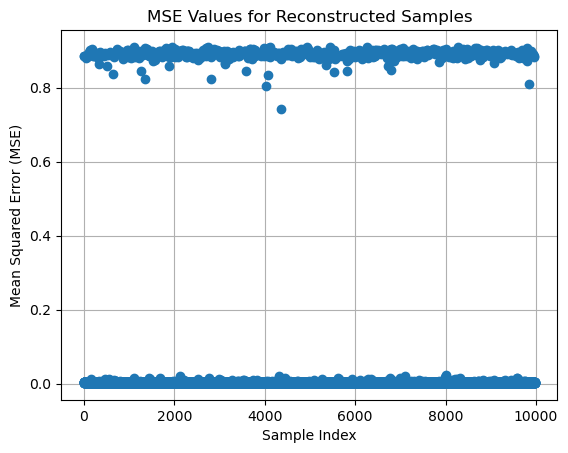

In [91]:
# Plotting MSE values
plt.plot(mse, marker='o', linestyle='')
plt.xlabel('Sample Index')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('MSE Values for Reconstructed Samples')
plt.grid(True)
plt.show()

In [92]:
# Set a threshold for identifying anomalies
threshold = np.percentile(mse, 85)
threshold

0.0036723320839302633

In [93]:
# Classify data points as normal (0) or anomaly (1) based on the threshold
y_pred = (mse > threshold).astype(int)

In [94]:



# Evaluate model performance using labeled data
accuracy = accuracy_score(y_test_final, y_pred)
conf_matrix = confusion_matrix(y_test_final, y_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9061842237145434
Confusion Matrix:
[[8480  936]
 [   0  561]]


In [95]:
precision = precision_score(y_test_final, y_pred)
recall = recall_score(y_test_final, y_pred)
f1 = f1_score(y_test_final, y_pred)

# Print all evaluation metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")

Precision: 0.834749498997996
Recall: 0.9303147278152231
F1-score: 0.8751895043731778


# Baseline

In [16]:
df.drop(['AIT201', 'P602'], axis=1, inplace=True)

In [17]:
df.columns

Index(['Timestamp', 'FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT202',
       'AIT203', 'FIT201', 'MV201', 'P201', 'P203', 'P204', 'P205', 'P206',
       'DPIT301', 'FIT301', 'LIT301', 'MV301', 'MV302', 'MV303', 'MV304',
       'P301', 'P302', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'P402', 'P403',
       'UV401', 'AIT501', 'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502',
       'FIT503', 'FIT504', 'P501', 'PIT501', 'PIT502', 'PIT503', 'FIT601',
       'Normal/Attack'],
      dtype='object')

In [18]:
excluded_cols = [col for col in df_columns if col not in df.columns]
excluded_cols

['AIT201', 'P202', 'P401', 'P404', 'P502', 'P601', 'P602', 'P603']

In [19]:
df.rename(columns={'Normal/Attack': 'Attack'}, inplace=True)
df.columns

Index(['Timestamp', 'FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT202',
       'AIT203', 'FIT201', 'MV201', 'P201', 'P203', 'P204', 'P205', 'P206',
       'DPIT301', 'FIT301', 'LIT301', 'MV301', 'MV302', 'MV303', 'MV304',
       'P301', 'P302', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'P402', 'P403',
       'UV401', 'AIT501', 'AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502',
       'FIT503', 'FIT504', 'P501', 'PIT501', 'PIT502', 'PIT503', 'FIT601',
       'Attack'],
      dtype='object')

In [20]:
df['Attack'].unique()

array(['Normal', 'Attack', 'A ttack'], dtype=object)

In [21]:
# Convert 'Attack' column in binary
mapping = {'Normal': 0, 'Attack': 1, 'A ttack': 1}
df['Attack'] = df['Attack'].map(mapping)
df['Attack'].unique()

array([0, 1], dtype=int64)

In [22]:
# Convert 'Timestamp' to datetime and set it as the index
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df.set_index('Timestamp', inplace=True)

In [23]:
labels = df['Attack']

In [24]:
# Drop the 'Attack' column from the DataFrame
df = df.drop(columns=['Attack'])

In [25]:
df.head()

,FIT101,LIT101,MV101,P101,P102,AIT202,AIT203,FIT201,MV201,P201,...,AIT504,FIT501,FIT502,FIT503,FIT504,P501,PIT501,PIT502,PIT503,FIT601
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,2,2,1,8.19008,306.101,2.471278,2,1,...,12.68905,0.001666,0.001409,0.001664,0.0,1,10.02948,0.0,4.277749,0.000256
2015-12-22 16:00:01,2.457163,261.1879,2,2,1,8.19008,306.101,2.468587,2,1,...,12.68905,0.001666,0.001409,0.001664,0.0,1,10.02948,0.0,4.277749,0.000256
2015-12-22 16:00:02,2.439548,260.9131,2,2,1,8.19008,306.101,2.467305,2,1,...,12.68905,0.001666,0.001409,0.001664,0.0,1,10.02948,0.0,4.277749,0.000256
2015-12-22 16:00:03,2.428338,260.2850,2,2,1,8.19008,306.101,2.466536,2,1,...,12.68905,0.001666,0.001409,0.001664,0.0,1,10.02948,0.0,4.277749,0.000256
2015-12-22 16:00:04,2.424815,259.8925,2,2,1,8.19008,306.101,2.466536,2,1,...,12.68905,0.001666,0.001409,0.001664,0.0,1,10.02948,0.0,4.277749,0.000256


In [26]:
# Find categorical and numerical features
categorical_cols = df.select_dtypes(include=['int64']).columns

In [27]:
# Check for missing values in the original categorical columns
missing_values = df[categorical_cols].isnull().sum()
print("Missing values in original categorical columns:")
print(missing_values)


Missing values in original categorical columns:
MV101    0
P101     0
P102     0
MV201    0
P201     0
P203     0
P204     0
P205     0
P206     0
MV301    0
MV302    0
MV303    0
MV304    0
P301     0
P302     0
P402     0
P403     0
UV401    0
P501     0
dtype: int64


In [28]:
# Fill missing values with a default value or use imputation methods if needed
# For example, you can fill missing values with the mean or mode
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mean())


In [29]:
from sklearn.preprocessing import OneHotEncoder

# One-hot encode categorical columns
encoder = OneHotEncoder(drop='first', sparse=False)
df_encoded = pd.DataFrame(encoder.fit_transform(df[categorical_cols]))
df_encoded.columns = encoder.get_feature_names_out(categorical_cols)

C:\Users\Gjirafa\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [30]:
df_encoded.head()

,MV101_1,MV101_2,P101_2,P102_2,MV201_1,MV201_2,P201_2,P203_2,P204_2,P205_2,...,MV303_1,MV303_2,MV304_1,MV304_2,P301_2,P302_2,P402_2,P403_2,UV401_2,P501_2
0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [31]:
categorical_cols

Index(['MV101', 'P101', 'P102', 'MV201', 'P201', 'P203', 'P204', 'P205',
       'P206', 'MV301', 'MV302', 'MV303', 'MV304', 'P301', 'P302', 'P402',
       'P403', 'UV401', 'P501'],
      dtype='object')

In [32]:
# Reset the index of df before concatenation
df.reset_index(inplace=True)

In [33]:
# Concatenate the one-hot encoded columns with the original DataFrame
df = pd.concat([df, df_encoded], axis=1)

In [34]:
# Set 'Timestamp' back as the index
df.set_index('Timestamp', inplace=True)

In [35]:
df.head()

,FIT101,LIT101,MV101,P101,P102,AIT202,AIT203,FIT201,MV201,P201,...,MV303_1,MV303_2,MV304_1,MV304_2,P301_2,P302_2,P402_2,P403_2,UV401_2,P501_2
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,2,2,1,8.19008,306.101,2.471278,2,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-12-22 16:00:01,2.457163,261.1879,2,2,1,8.19008,306.101,2.468587,2,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-12-22 16:00:02,2.439548,260.9131,2,2,1,8.19008,306.101,2.467305,2,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-12-22 16:00:03,2.428338,260.2850,2,2,1,8.19008,306.101,2.466536,2,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-12-22 16:00:04,2.424815,259.8925,2,2,1,8.19008,306.101,2.466536,2,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [36]:
# Drop the original categorical columns
df = df.drop(columns=categorical_cols)

In [37]:
from sklearn.preprocessing import MinMaxScaler

# Apply Min-Max scaling
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)

In [38]:
# Combine the scaled DataFrame with the labels
df_scaled = pd.DataFrame(df_scaled, columns=df.columns, index=df.index)
df_scaled['Attack'] = labels

In [39]:
df_scaled.head()

,FIT101,LIT101,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,AIT402,...,MV303_2,MV304_1,MV304_2,P301_2,P302_2,P402_2,P403_2,UV401_2,P501_2,Attack
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,0.894987,0.160292,0.732892,0.073596,0.874201,0.462186,0.940694,0.182199,0.0,0.156615,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
2015-12-22 16:00:01,0.890230,0.159845,0.732892,0.073596,0.873249,0.462186,0.940371,0.182199,0.0,0.156615,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
2015-12-22 16:00:02,0.883848,0.159533,0.732892,0.073596,0.872796,0.463182,0.939886,0.182199,0.0,0.156615,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
2015-12-22 16:00:03,0.879786,0.158819,0.732892,0.073596,0.872524,0.463182,0.939886,0.182049,0.0,0.156615,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
2015-12-22 16:00:04,0.878510,0.158372,0.732892,0.073596,0.872524,0.463182,0.939886,0.181936,0.0,0.156615,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0


<Axes: >

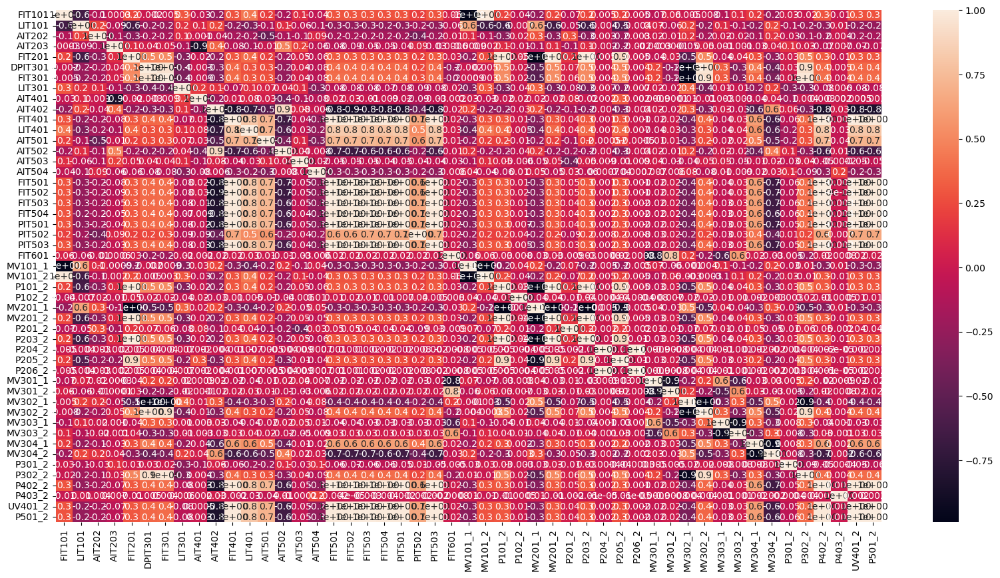

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
#figure size
plt.figure(figsize=(20, 10))
#heat map for correlation coefficient
sns.heatmap(df.corr(), annot=True, fmt="0.1")

In [43]:
import numpy as np

window_size = 120
overlap_size = 115

sequences = []
labels = []

for i in range(0, len(df_scaled) - window_size + 1, overlap_size):
    window = df_scaled.iloc[i:i + window_size]
    sequence = window.values
    label = window['Attack'].values[-1]
    sequences.append(sequence)
    labels.append(label)
        
sequences = np.array(sequences)
labels = np.array(labels)

In [44]:
from sklearn.model_selection import StratifiedKFold

In [48]:
train_accuracies = []
train_losses = []
val_accuracies = []
val_losses = []

for train_index, test_index in skf.split(sequences, labels):
    X_train, X_test = sequences[train_index], sequences[test_index]
    y_train, y_test = labels[train_index], labels[test_index]

NameError: name 'skf' is not defined

In [47]:
df_scaled['Attack'] = labels

In [48]:
# Define sliding window parameters
window_size = 120
overlap_size = 115

# Create sequences for training using sliding window approach
sequences = []
df_labels = []

for i in range(0, len(df_scaled) - window_size, overlap_size):
    seq = df_scaled.iloc[i:i + window_size].values
    sequences.append(seq)
    df_labels.append(df_scaled['Attack'].iloc[i + window_size - 1])

In [75]:
sequences

[array([[0.89498704, 0.16029167, 0.73289154, ..., 0.        , 0.        ,
         0.        ],
        [0.89022968, 0.15984534, 0.73289154, ..., 0.        , 0.        ,
         0.        ],
        [0.88384777, 0.15953284, 0.73289154, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.94998813, 0.16377335, 0.74801064, ..., 0.        , 0.        ,
         0.        ],
        [0.94778354, 0.16350554, 0.74801064, ..., 0.        , 0.        ,
         0.        ],
        [0.94302618, 0.16319305, 0.74801064, ..., 0.        , 0.        ,
         0.        ]]),
 array([[0.96344866, 0.16350554, 0.74801064, ..., 0.        , 0.        ,
         0.        ],
        [0.95753049, 0.16355012, 0.74801064, ..., 0.        , 0.        ,
         0.        ],
        [0.94998813, 0.16377335, 0.74801064, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 1.        , 0.76967131, ..., 1.        , 0.        ,
         0.        ],
        [0. 

In [41]:
# Drop the 'Attack' column from the DataFrame
df_scaled = df_scaled.drop(columns=['Attack'])

In [52]:
from sklearn.model_selection import train_test_split

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(sequences, labels, test_size=0.2, random_state=42)

In [55]:
import tensorflow as tf
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from tensorflow import keras

ModuleNotFoundError: No module named 'tensorflow'

In [53]:
X_train

array([[[0.94813171, 0.55568657, 0.90049068, ..., 1.        ,
         1.        , 0.        ],
        [0.94302618, 0.5564454 , 0.90049068, ..., 1.        ,
         1.        , 0.        ],
        [0.93594793, 0.55715966, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        ...,
        [0.88048273, 0.61916053, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        [0.87932228, 0.61991937, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        [0.87885818, 0.62027644, 0.90006201, ..., 1.        ,
         1.        , 0.        ]],

       [[0.91889049, 0.2658582 , 0.80044594, ..., 1.        ,
         1.        , 0.        ],
        [0.9144813 , 0.26567966, 0.79894474, ..., 1.        ,
         1.        , 0.        ],
        [0.90751899, 0.26541186, 0.79894474, ..., 1.        ,
         1.        , 0.        ],
        ...,
        [0.95892317, 0.268715  , 0.79776513, ..., 1.        ,
         1.        , 0.        ],
        [0.9

In [53]:
import numpy as np

In [50]:
# Convert sequences and labels to NumPy arrays
X = np.array(sequences)
y = np.array(labels)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


NameError: name 'train_test_split' is not defined

In [57]:
pip install tensorflow 


  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/93/21/9b035a4f823d6aee2917c75415be9a95861ff3d73a0a65e48edbf210cec1/tensorflow-2.15.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.15.0 from https://files.pythonhosted.org/packages/4c/48/1a5a15517f18eaa4ff8d598b1c000300b20c1bb0e624539d702117a0c369/tensorflow_intel-2.15.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/01/e4/dc0a1dcc4e74e08d7abedab278c795eef54a224363bb18f5692f416d834f/absl_py-2.0.0-py3-none-any.whl.metadata
  Using cached absl_py-2.0.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metad

In [58]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow import keras
import tensorflow as tf

# Assuming X_train and X_test have shape (number of samples, window size, number of features)
input_shape = (X_train.shape[1], X_train.shape[2])

model = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, activation='relu', return_sequences=True, input_shape=input_shape),
    tf.keras.layers.LSTM(32, activation='relu', return_sequences=False),
    tf.keras.layers.RepeatVector(X_train.shape[1]),
    tf.keras.layers.LSTM(32, activation='relu', return_sequences=True),
    tf.keras.layers.LSTM(64, activation='relu', return_sequences=True),
    tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(X_train.shape[2]))
])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, clipvalue=1.0) 
model.compile(optimizer=optimizer, loss='mse')

# Train the model
history = model.fit(X_train, X_train, epochs=5, batch_size=32, validation_split=0.1,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)



Epoch 1/5

186/186 [==============================] - 198s 975ms/step - loss: 404529682055168.0000 - val_loss: 0.4589
Epoch 2/5
186/186 [==============================] - 32s 171ms/step - loss: 0.4434 - val_loss: 0.4272
Epoch 3/5
186/186 [==============================] - 32s 172ms/step - loss: 0.4094 - val_loss: 0.3880
Epoch 4/5
186/186 [==============================] - 32s 175ms/step - loss: 0.2777 - val_loss: 0.1288
Epoch 5/5
186/186 [==============================] - 32s 174ms/step - loss: 0.0857 - val_loss: 0.0684


array([[[0.94813171, 0.55568657, 0.90049068, ..., 1.        ,
         1.        , 0.        ],
        [0.94302618, 0.5564454 , 0.90049068, ..., 1.        ,
         1.        , 0.        ],
        [0.93594793, 0.55715966, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        ...,
        [0.88048273, 0.61916053, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        [0.87932228, 0.61991937, 0.90006201, ..., 1.        ,
         1.        , 0.        ],
        [0.87885818, 0.62027644, 0.90006201, ..., 1.        ,
         1.        , 0.        ]],

       [[0.91889049, 0.2658582 , 0.80044594, ..., 1.        ,
         1.        , 0.        ],
        [0.9144813 , 0.26567966, 0.79894474, ..., 1.        ,
         1.        , 0.        ],
        [0.90751899, 0.26541186, 0.79894474, ..., 1.        ,
         1.        , 0.        ],
        ...,
        [0.95892317, 0.268715  , 0.79776513, ..., 1.        ,
         1.        , 0.        ],
        [0.9

In [55]:
# Define the LSTM autoencoder model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    tf.keras.layers.LSTM(32, activation='relu', return_sequences=False),
    tf.keras.layers.RepeatVector(X_train.shape[1]),
    tf.keras.layers.LSTM(32, activation='relu', return_sequences=True),
    tf.keras.layers.LSTM(64, activation='relu', return_sequences=True),
    tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(X_train.shape[2]))
])

model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.1,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)


Epoch 1/5


InvalidArgumentError: Graph execution error:

Detected at node gradient_tape/mean_squared_error/BroadcastGradientArgs defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 736, in start

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 195, in start

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\base_events.py", line 607, in run_forever

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\events.py", line 80, in _run

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 516, in dispatch_queue

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 505, in process_one

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 412, in dispatch_shell

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 740, in execute_request

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\ipykernel\zmqshell.py", line 546, in run_cell

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code

  File "C:\Users\Gjirafa\AppData\Local\Temp\ipykernel_26080\3870590701.py", line 14, in <module>

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1783, in fit

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1130, in train_step

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\optimizers\optimizer.py", line 543, in minimize

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\optimizers\optimizer.py", line 276, in compute_gradients

Incompatible shapes: [32,120,50] vs. [32]
	 [[{{node gradient_tape/mean_squared_error/BroadcastGradientArgs}}]] [Op:__inference_train_function_7195]

In [59]:
import joblib

model_filename = 'C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detectiontimeseries_lstm_model_v4.pkl'
joblib.dump(model, model_filename)

['C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detectiontimeseries_lstm_model_v4.pkl']

In [60]:
model.evaluate(X_test, y_test)

InvalidArgumentError: Graph execution error:

Detected at node mean_squared_error/SquaredDifference defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\traitlets\config\application.py", line 1053, in launch_instance

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\kernelapp.py", line 739, in start

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\tornado\platform\asyncio.py", line 195, in start

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\base_events.py", line 607, in run_forever

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "C:\Users\Gjirafa\anaconda3\Lib\asyncio\events.py", line 80, in _run

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\kernelbase.py", line 529, in dispatch_queue

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\kernelbase.py", line 518, in process_one

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\kernelbase.py", line 424, in dispatch_shell

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\kernelbase.py", line 766, in execute_request

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\ipkernel.py", line 429, in do_execute

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\ipykernel\zmqshell.py", line 549, in run_cell

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py", line 3046, in run_cell

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py", line 3101, in _run_cell

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py", line 3306, in run_cell_async

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py", line 3488, in run_ast_nodes

  File "C:\Users\Gjirafa\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py", line 3548, in run_code

  File "C:\Users\Gjirafa\AppData\Local\Temp\ipykernel_20600\3899891647.py", line 1, in <module>

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2296, in evaluate

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 4108, in run_step

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2066, in test_function

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2049, in step_function

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2037, in run_step

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1919, in test_step

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1209, in compute_loss

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\compile_utils.py", line 277, in __call__

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 143, in __call__

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 270, in call

  File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 1706, in mean_squared_error

Incompatible shapes: [32] vs. [32,120,50]
	 [[{{node mean_squared_error/SquaredDifference}}]] [Op:__inference_test_function_11327]

In [61]:
# Make predictions on the test set
y_pred = model.predict(X_test)

52/52 [==============================] - 3s 54ms/step


In [62]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 120, 64)           29440     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 repeat_vector (RepeatVecto  (None, 120, 32)           0         
 r)                                                              
                                                                 
 lstm_2 (LSTM)               (None, 120, 32)           8320      
                                                                 
 lstm_3 (LSTM)               (None, 120, 64)           24832     
                                                                 
 time_distributed (TimeDist  (None, 120, 50)           3250      
 ributed)                                               

In [62]:
# Calculate reconstruction error for each sample
mse = np.mean(np.square(X_test - y_pred), axis=1)
mse

array([[0.003566  ],
       [0.82576937],
       [0.003566  ],
       ...,
       [0.003566  ],
       [0.003566  ],
       [0.003566  ]])

In [63]:
# Set a threshold for anomaly detection
threshold = np.percentile(mse, 95)
threshold

0.8257693676222571

In [66]:
# Classify samples as normal or anomaly based on the threshold
y_pred_labels = np.where(mse > threshold, 1, 0)
y_pred_labels

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

In [67]:
# Evaluate model performance
conf_matrix = confusion_matrix(y_test, y_pred_labels)

In [68]:
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred_labels)

print("Confusion Matrix:")
print(conf_matrix)
print("Precision:", precision[1])
print("Recall:", recall[1])
print("F1 Score:", f1[1])

Confusion Matrix:
[[176580      1837]
 [ 2764      8157]]
Precision: 0.797252389126723
Recall: 0.9156372963517853
F1 Score: 0.8464118378254921


C:\Users\Gjirafa\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support

In [61]:
final_df['Timestamp'] = pd.to_datetime(final_df['Timestamp'])

In [62]:
final_df.pop('Attack_0')
final_df.pop('Attack_1')

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
946714    0.0
946715    0.0
946716    0.0
946717    0.0
946718    0.0
Name: Attack_1, Length: 946719, dtype: float64

In [63]:
final_df.head()

,Timestamp,FIT101,LIT101,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,P302_2,P402_1,P402_2,P403_1,P403_2,UV401_1,UV401_2,P501_1,P501_2,Attack
0,2015-12-22 16:00:00,2.470294,261.5804,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1
1,2015-12-22 16:00:01,2.457163,261.1879,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1
2,2015-12-22 16:00:02,2.439548,260.9131,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1
3,2015-12-22 16:00:03,2.428338,260.2850,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1
4,2015-12-22 16:00:04,2.424815,259.8925,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1


In [63]:
start_attack_time = pd.to_datetime('2015-12-28 10:00:00')
train_df = final_df[(final_df['Timestamp'] < start_attack_time)]
test_df = final_df[(final_df['Timestamp'] >= start_attack_time)]

In [64]:
train_df.shape

(496800, 71)

In [65]:
test_df.shape

(449919, 71)

In [66]:
train_df = train_df.set_index('Timestamp')
test_df = test_df.set_index('Timestamp')

In [67]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Fit the scaler to the training data and transform it
train_data_scaled = scaler.fit_transform(train_df)


# Transform the test data using the same scaler
test_data_scaled = scaler.transform(test_df)

In [69]:
train_data_scaled

array([[0.89989479, 0.16029167, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.89511135, 0.15984534, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.88869444, 0.15953284, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.88694441, 0.45744046, 0.25853021, ..., 1.        , 0.        ,
        0.        ],
       [0.88461079, 0.45748504, 0.25853021, ..., 1.        , 0.        ,
        0.        ],
       [0.88414414, 0.45739577, 0.25853021, ..., 1.        , 0.        ,
        0.        ]])

In [ ]:
test_data_scaled.head()

In [41]:
import numpy as np

# Create empty lists to store the windowed data
windowed_data = []
labels = [] 

l = 120
l_overlap = 115

# Determine the stride (step size) for the sliding window with overlap.
stride = l - l_overlap

# Iterate over the data with the sliding window.
for i in range(0, len(train_data_scaled) - l + 1, stride):
    # Extract a window of data.
    window = train_data_scaled[i:i + l]

    # Append the window to the list of windowed data.
    windowed_data.append(window)

In [42]:

# Convert the windowed data to a NumPy array.
windowed_data = np.array(windowed_data)

In [44]:
pip install tensorflow 


  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/80/6f/57d36f6507e432d7fc1956b2e9e8530c5c2d2bfcd8821bcbfae271cd6688/tensorflow-2.14.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.14.0 from https://files.pythonhosted.org/packages/ad/6e/1bfe367855dd87467564f7bf9fa14f3b17889988e79598bc37bf18f5ffb6/tensorflow_intel-2.14.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/01/e4/dc0a1dcc4e74e08d7abedab278c795eef54a224363bb18f5692f416d834f/absl_py-2.0.0-py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metadata
     ---------------------------------------- 0.0/57.5 kB ? eta -:--:--
     ---------------------------------------- 57.

In [46]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [44]:
train_data_scaled.shape

(496800, 70)

In [48]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow import keras
import tensorflow as tf

num_features = windowed_data.shape[1]

# 1. Split the windowed data into training and testing sets
split_ratio = 0.8
split_index = int(len(windowed_data) * split_ratio)

train_data = windowed_data[:split_index]
test_data = windowed_data[split_index:]

# 2. Define and train the LSTM autoencoder model
model = Sequential()
model.add(LSTM(64, input_shape=(l, 70), return_sequences=True))
model.add(LSTM(32, return_sequences=True))
model.add(Dense(70))
model.add(LSTM(32, return_sequences=True))
model.add(LSTM(64))
model.compile(optimizer='adam', loss='mse') 
history = model.fit(train_data, train_data, epochs=50, batch_size=32, validation_split=0.1,
                    callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)  # Train the model



Epoch 1/50


ValueError: in user code:

    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1127, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1185, in compute_loss
        return self.compiled_loss(
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 64 and 70 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_3/lstm_14/PartitionedCall, IteratorGetNext:1)' with input shapes: [?,64], [?,120,70].


In [53]:

# 3. Use the trained autoencoder to reconstruct the data
reconstructed_data = model.predict(test_data)

# 4. Calculate reconstruction errors for the testing data
reconstruction_errors = np.mean(np.square(test_data - reconstructed_data), axis=1)

# 5. Define a threshold for anomaly detection based on the reconstruction errors
threshold = np.percentile(reconstruction_errors, 95) 

# Detect anomalies based on the threshold
anomalies = reconstruction_errors > threshold

# 'anomalies' now contains True for data points classified as anomalies, and False for normal data points.

621/621 [==============================] - 24s 36ms/step


In [54]:
anomalies

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False,  True, ..., False, False, False],
       [False, False,  True, ..., False, False, False],
       [False, False,  True, ..., False, False, False]])

In [55]:
threshold

0.0026670999943818247

In [56]:
reconstruction_errors

array([[9.32381325e-05, 5.71739750e-04, 2.84109063e-04, ...,
        8.01813546e-05, 1.02620907e-06, 3.65965622e-07],
       [9.27126520e-05, 5.70076821e-04, 2.90493842e-04, ...,
        8.03740941e-05, 1.02408027e-06, 3.65436098e-07],
       [9.22304846e-05, 5.69224041e-04, 2.94582624e-04, ...,
        8.05294475e-05, 1.02103164e-06, 3.63277459e-07],
       ...,
       [2.12142336e-03, 1.38269172e-03, 2.97004746e-03, ...,
        7.50263246e-04, 1.64131422e-06, 1.77078788e-07],
       [2.20148441e-03, 1.37583012e-03, 2.95405691e-03, ...,
        7.50646342e-04, 1.64344028e-06, 1.80028134e-07],
       [2.45532790e-03, 1.36796893e-03, 2.96579439e-03, ...,
        7.50468869e-04, 1.64746715e-06, 1.78414367e-07]])

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

2484/2484 [==============================] - 81s 33ms/step
Reconstruction error threshold: 1.0401890347401301


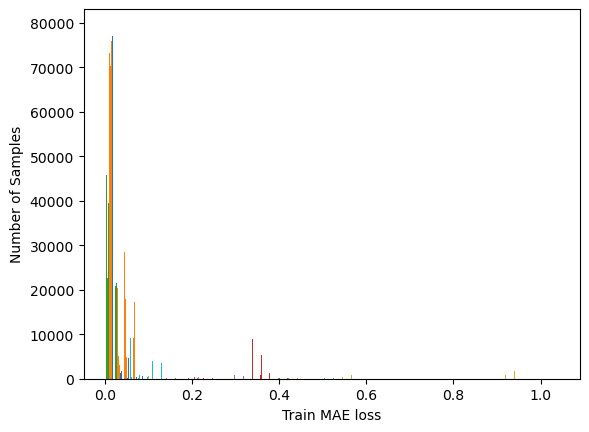

In [61]:
train_pred = model.predict(train_data)

train_mae_loss = np.mean(np.abs(train_pred - train_data), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

threshold = np.max(train_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

Reconstruction error threshold: 0.3563777528021649


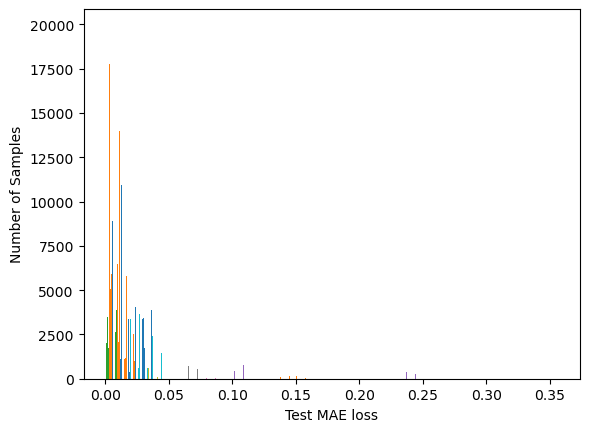

In [60]:
test_mae_loss = np.mean(np.abs(reconstructed_data - test_data), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of Samples');

threshold = np.max(test_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

(array([[ 4190.,   840.,  5900., ...,     0.,     0.,     0.],
        [    0.,  2212.,  3689., ...,     0.,     0.,     0.],
        [ 3865.,  4813.,  6022., ...,     0.,     0.,     0.],
        ...,
        [ 7938.,  1736., 10194., ...,     0.,     0.,     0.],
        [19868.,     0.,     0., ...,     0.,     0.,     0.],
        [19868.,     0.,     0., ...,     0.,     0.,     0.]]),
 array([1.80547747e-05, 1.18967114e-02, 2.37753680e-02, 3.56540246e-02,
        4.75326812e-02, 5.94113378e-02, 7.12899944e-02, 8.31686510e-02,
        9.50473076e-02, 1.06925964e-01, 1.18804621e-01, 1.30683277e-01,
        1.42561934e-01, 1.54440591e-01, 1.66319247e-01, 1.78197904e-01,
        1.90076560e-01, 2.01955217e-01, 2.13833874e-01, 2.25712530e-01,
        2.37591187e-01, 2.49469843e-01, 2.61348500e-01, 2.73227157e-01,
        2.85105813e-01, 2.96984470e-01, 3.08863126e-01, 3.20741783e-01,
        3.32620440e-01, 3.44499096e-01, 3.56377753e-01]),
 <a list of 70 BarContainer objects>)

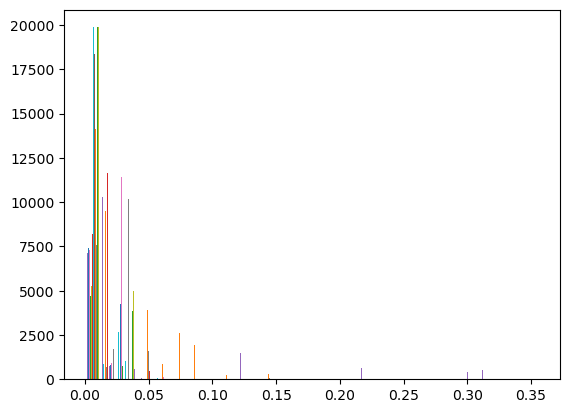

In [62]:
plt.hist(test_mae_loss, bins=30)

In [63]:
import joblib

model_filename = 'C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detection_lstm_model.pkl'
joblib.dump(model, model_filename)

['C:\\Users\\Gjirafa\\Alberti\\AlbZa\\DS Lab2\\Dataset\\anomaly_detection_lstm_model.pkl']

In [108]:
loaded_model = joblib.load(model_filename)

In [119]:
test_data_scaled

Index(['FIT101', 'LIT101', 'AIT202', 'AIT203', 'FIT201', 'DPIT301', 'FIT301',
       'LIT301', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'AIT501', 'AIT502',
       'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504', 'PIT501',
       'PIT502', 'PIT503', 'FIT601', 'MV101_0', 'MV101_1', 'MV101_2', 'P101_1',
       'P101_2', 'P102_1', 'P102_2', 'MV201_0', 'MV201_1', 'MV201_2', 'P201_1',
       'P201_2', 'P203_1', 'P203_2', 'P204_1', 'P204_2', 'P205_1', 'P205_2',
       'P206_1', 'P206_2', 'MV301_0', 'MV301_1', 'MV301_2', 'MV302_0',
       'MV302_1', 'MV302_2', 'MV303_0', 'MV303_1', 'MV303_2', 'MV304_0',
       'MV304_1', 'MV304_2', 'P301_1', 'P301_2', 'P302_1', 'P302_2', 'P402_1',
       'P402_2', 'P403_1', 'P403_2', 'UV401_1', 'UV401_2', 'P501_1', 'P501_2',
       'Attack_0', 'Attack_1'],
      dtype='object')

In [120]:
# Create empty lists to store the windowed data and labels.
windowed_test_data = []
labels = []

l = 120
l_overlap = 115

# Determine the stride (step size) for the sliding window with overlap.
stride = l - l_overlap

# Iterate over the data with the sliding window.
for i in range(0, len(test_data_scaled) - l + 1, stride):
    # Extract a window of data.
    window = test_data_scaled[i:i + l]

    # Append the windowed data to the list.
    windowed_test_data.append(window)

    # Extract the corresponding label for this window.
    label = test_data_scaled[[i + l - 1]]
    labels.append(label)

In [121]:

# Convert the windowed data to a NumPy array.
windowed_data = np.array(windowed_data)

In [122]:
test_history = loaded_model.predict(windowed_test_data)

ValueError: in user code:

    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2416, in predict_function  *
        return step_function(self, iterator)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2401, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2389, in run_step  **
        outputs = model.predict_step(data)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2357, in predict_step
        return self(x, training=False)
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\Gjirafa\anaconda3\Lib\site-packages\keras\src\engine\input_spec.py", line 219, in assert_input_compatibility
        raise ValueError(

    ValueError: Layer "sequential_6" expects 1 input(s), but it received 89960 input tensors. Inputs received: [<tf.Tensor 'IteratorGetNext:0' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:90' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:91' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:92' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:93' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:94' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:95' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:96' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:97' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:98' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:99' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:1999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:2999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:3999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:4999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:5999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:6999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:7999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:8999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:9999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:10999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:11999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:12999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:13999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:14999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:15999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:16999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:17999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:18999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:19999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:20999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:21999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:22999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:23999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:24999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:25999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:26999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:27999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:28999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:29999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:30999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:31999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:32999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:33999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:34999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:35999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:36999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:37999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:38999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:39999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:40999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:41999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:42999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:43999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:44999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:45999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:46999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:47999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:48999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:49999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:50999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:51999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:52999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:53999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:54999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:55999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:56999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:57999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:58999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:59999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:60999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:61999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:62999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:63999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:64999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:65999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:66999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:67999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:68999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:69999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:70999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:71999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:72999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:73999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:74999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:75999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:76999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:77999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:78999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:79999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:80999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:81999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:82999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:83999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:84999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:85999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:86999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:87999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88959' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88960' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88961' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88962' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88963' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88964' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88965' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88966' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88967' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88968' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88969' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88970' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88971' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88972' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88973' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88974' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88975' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88976' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88977' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88978' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88979' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88980' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88981' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88982' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88983' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88984' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88985' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88986' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88987' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88988' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88989' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88990' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88991' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88992' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88993' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88994' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88995' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88996' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88997' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88998' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:88999' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89000' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89001' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89002' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89003' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89004' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89005' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89006' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89007' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89008' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89009' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89010' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89011' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89012' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89013' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89014' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89015' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89016' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89017' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89018' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89019' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89020' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89021' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89022' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89023' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89024' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89025' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89026' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89027' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89028' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89029' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89030' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89031' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89032' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89033' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89034' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89035' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89036' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89037' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89038' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89039' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89040' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89041' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89042' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89043' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89044' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89045' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89046' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89047' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89048' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89049' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89050' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89051' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89052' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89053' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89054' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89055' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89056' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89057' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89058' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89059' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89060' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89061' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89062' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89063' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89064' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89065' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89066' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89067' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89068' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89069' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89070' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89071' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89072' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89073' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89074' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89075' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89076' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89077' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89078' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89079' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89080' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89081' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89082' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89083' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89084' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89085' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89086' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89087' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89088' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89089' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89090' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89091' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89092' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89093' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89094' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89095' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89096' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89097' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89098' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89099' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89100' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89101' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89102' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89103' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89104' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89105' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89106' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89107' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89108' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89109' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89110' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89111' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89112' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89113' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89114' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89115' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89116' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89117' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89118' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89119' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89120' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89121' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89122' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89123' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89124' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89125' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89126' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89127' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89128' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89129' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89130' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89131' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89132' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89133' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89134' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89135' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89136' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89137' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89138' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89139' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89140' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89141' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89142' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89143' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89144' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89145' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89146' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89147' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89148' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89149' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89150' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89151' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89152' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89153' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89154' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89155' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89156' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89157' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89158' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89159' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89160' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89161' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89162' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89163' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89164' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89165' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89166' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89167' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89168' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89169' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89170' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89171' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89172' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89173' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89174' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89175' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89176' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89177' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89178' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89179' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89180' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89181' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89182' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89183' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89184' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89185' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89186' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89187' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89188' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89189' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89190' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89191' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89192' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89193' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89194' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89195' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89196' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89197' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89198' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89199' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89200' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89201' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89202' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89203' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89204' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89205' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89206' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89207' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89208' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89209' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89210' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89211' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89212' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89213' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89214' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89215' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89216' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89217' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89218' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89219' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89220' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89221' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89222' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89223' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89224' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89225' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89226' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89227' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89228' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89229' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89230' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89231' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89232' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89233' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89234' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89235' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89236' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89237' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89238' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89239' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89240' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89241' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89242' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89243' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89244' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89245' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89246' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89247' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89248' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89249' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89250' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89251' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89252' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89253' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89254' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89255' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89256' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89257' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89258' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89259' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89260' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89261' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89262' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89263' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89264' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89265' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89266' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89267' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89268' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89269' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89270' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89271' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89272' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89273' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89274' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89275' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89276' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89277' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89278' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89279' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89280' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89281' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89282' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89283' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89284' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89285' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89286' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89287' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89288' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89289' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89290' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89291' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89292' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89293' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89294' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89295' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89296' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89297' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89298' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89299' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89300' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89301' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89302' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89303' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89304' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89305' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89306' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89307' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89308' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89309' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89310' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89311' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89312' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89313' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89314' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89315' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89316' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89317' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89318' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89319' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89320' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89321' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89322' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89323' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89324' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89325' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89326' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89327' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89328' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89329' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89330' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89331' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89332' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89333' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89334' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89335' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89336' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89337' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89338' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89339' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89340' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89341' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89342' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89343' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89344' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89345' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89346' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89347' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89348' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89349' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89350' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89351' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89352' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89353' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89354' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89355' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89356' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89357' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89358' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89359' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89360' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89361' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89362' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89363' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89364' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89365' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89366' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89367' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89368' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89369' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89370' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89371' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89372' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89373' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89374' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89375' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89376' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89377' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89378' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89379' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89380' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89381' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89382' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89383' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89384' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89385' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89386' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89387' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89388' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89389' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89390' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89391' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89392' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89393' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89394' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89395' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89396' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89397' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89398' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89399' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89400' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89401' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89402' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89403' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89404' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89405' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89406' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89407' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89408' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89409' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89410' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89411' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89412' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89413' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89414' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89415' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89416' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89417' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89418' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89419' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89420' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89421' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89422' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89423' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89424' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89425' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89426' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89427' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89428' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89429' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89430' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89431' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89432' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89433' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89434' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89435' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89436' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89437' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89438' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89439' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89440' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89441' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89442' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89443' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89444' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89445' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89446' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89447' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89448' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89449' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89450' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89451' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89452' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89453' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89454' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89455' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89456' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89457' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89458' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89459' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89460' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89461' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89462' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89463' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89464' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89465' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89466' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89467' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89468' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89469' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89470' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89471' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89472' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89473' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89474' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89475' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89476' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89477' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89478' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89479' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89480' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89481' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89482' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89483' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89484' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89485' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89486' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89487' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89488' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89489' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89490' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89491' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89492' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89493' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89494' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89495' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89496' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89497' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89498' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89499' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89500' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89501' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89502' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89503' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89504' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89505' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89506' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89507' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89508' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89509' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89510' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89511' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89512' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89513' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89514' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89515' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89516' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89517' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89518' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89519' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89520' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89521' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89522' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89523' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89524' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89525' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89526' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89527' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89528' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89529' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89530' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89531' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89532' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89533' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89534' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89535' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89536' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89537' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89538' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89539' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89540' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89541' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89542' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89543' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89544' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89545' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89546' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89547' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89548' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89549' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89550' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89551' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89552' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89553' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89554' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89555' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89556' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89557' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89558' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89559' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89560' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89561' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89562' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89563' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89564' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89565' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89566' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89567' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89568' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89569' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89570' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89571' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89572' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89573' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89574' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89575' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89576' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89577' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89578' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89579' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89580' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89581' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89582' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89583' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89584' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89585' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89586' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89587' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89588' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89589' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89590' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89591' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89592' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89593' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89594' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89595' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89596' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89597' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89598' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89599' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89600' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89601' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89602' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89603' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89604' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89605' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89606' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89607' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89608' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89609' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89610' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89611' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89612' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89613' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89614' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89615' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89616' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89617' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89618' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89619' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89620' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89621' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89622' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89623' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89624' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89625' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89626' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89627' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89628' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89629' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89630' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89631' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89632' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89633' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89634' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89635' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89636' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89637' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89638' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89639' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89640' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89641' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89642' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89643' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89644' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89645' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89646' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89647' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89648' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89649' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89650' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89651' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89652' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89653' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89654' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89655' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89656' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89657' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89658' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89659' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89660' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89661' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89662' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89663' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89664' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89665' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89666' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89667' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89668' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89669' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89670' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89671' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89672' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89673' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89674' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89675' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89676' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89677' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89678' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89679' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89680' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89681' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89682' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89683' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89684' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89685' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89686' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89687' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89688' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89689' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89690' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89691' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89692' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89693' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89694' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89695' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89696' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89697' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89698' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89699' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89700' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89701' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89702' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89703' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89704' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89705' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89706' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89707' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89708' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89709' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89710' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89711' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89712' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89713' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89714' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89715' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89716' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89717' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89718' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89719' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89720' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89721' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89722' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89723' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89724' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89725' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89726' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89727' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89728' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89729' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89730' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89731' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89732' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89733' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89734' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89735' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89736' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89737' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89738' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89739' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89740' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89741' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89742' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89743' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89744' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89745' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89746' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89747' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89748' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89749' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89750' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89751' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89752' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89753' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89754' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89755' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89756' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89757' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89758' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89759' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89760' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89761' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89762' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89763' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89764' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89765' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89766' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89767' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89768' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89769' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89770' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89771' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89772' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89773' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89774' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89775' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89776' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89777' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89778' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89779' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89780' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89781' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89782' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89783' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89784' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89785' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89786' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89787' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89788' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89789' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89790' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89791' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89792' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89793' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89794' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89795' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89796' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89797' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89798' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89799' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89800' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89801' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89802' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89803' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89804' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89805' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89806' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89807' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89808' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89809' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89810' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89811' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89812' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89813' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89814' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89815' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89816' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89817' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89818' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89819' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89820' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89821' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89822' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89823' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89824' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89825' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89826' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89827' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89828' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89829' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89830' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89831' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89832' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89833' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89834' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89835' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89836' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89837' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89838' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89839' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89840' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89841' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89842' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89843' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89844' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89845' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89846' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89847' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89848' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89849' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89850' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89851' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89852' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89853' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89854' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89855' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89856' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89857' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89858' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89859' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89860' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89861' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89862' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89863' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89864' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89865' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89866' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89867' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89868' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89869' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89870' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89871' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89872' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89873' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89874' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89875' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89876' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89877' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89878' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89879' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89880' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89881' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89882' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89883' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89884' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89885' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89886' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89887' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89888' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89889' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89890' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89891' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89892' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89893' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89894' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89895' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89896' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89897' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89898' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89899' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89900' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89901' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89902' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89903' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89904' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89905' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89906' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89907' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89908' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89909' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89910' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89911' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89912' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89913' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89914' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89915' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89916' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89917' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89918' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89919' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89920' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89921' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89922' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89923' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89924' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89925' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89926' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89927' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89928' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89929' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89930' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89931' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89932' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89933' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89934' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89935' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89936' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89937' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89938' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89939' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89940' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89941' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89942' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89943' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89944' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89945' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89946' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89947' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89948' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89949' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89950' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89951' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89952' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89953' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89954' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89955' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89956' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89957' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89958' shape=(None, 70) dtype=float32>, <tf.Tensor 'IteratorGetNext:89959' shape=(None, 70) dtype=float32>]


In [115]:
windowed_test_data


[array([[0.88414414, 0.45739577, 0.25853021, ..., 1.        , 0.        ,
         0.        ],
        [0.89114463, 0.45744046, 0.25853021, ..., 1.        , 0.        ,
         0.        ],
        [0.90677872, 0.45739577, 0.25612101, ..., 1.        , 0.        ,
         0.        ],
        ...,
        [0.9544977 , 0.45864563, 0.25250785, ..., 1.        , 0.        ,
         0.        ],
        [0.95006397, 0.45811003, 0.25250785, ..., 1.        , 0.        ,
         0.        ],
        [0.94236368, 0.45819929, 0.25250785, ..., 1.        , 0.        ,
         0.        ]]),
 array([[0.95053062, 0.45855637, 0.25612101, ..., 1.        , 0.        ,
         0.        ],
        [0.9606811 , 0.45882417, 0.25612101, ..., 1.        , 0.        ,
         0.        ],
        [0.9661647 , 0.45895813, 0.25612101, ..., 1.        , 0.        ,
         0.        ],
        ...,
        [0.92591287, 0.45877959, 0.25250785, ..., 1.        , 0.        ,
         0.        ],
        [0.9